In [1]:
import os

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sn
import cv2 
import numpy as np

In [2]:
path = "../input/dfl-bundesliga-data-shootout/clips/08fd33_0.mp4"
vidcap = cv2.VideoCapture(path)

success, image = vidcap.read()

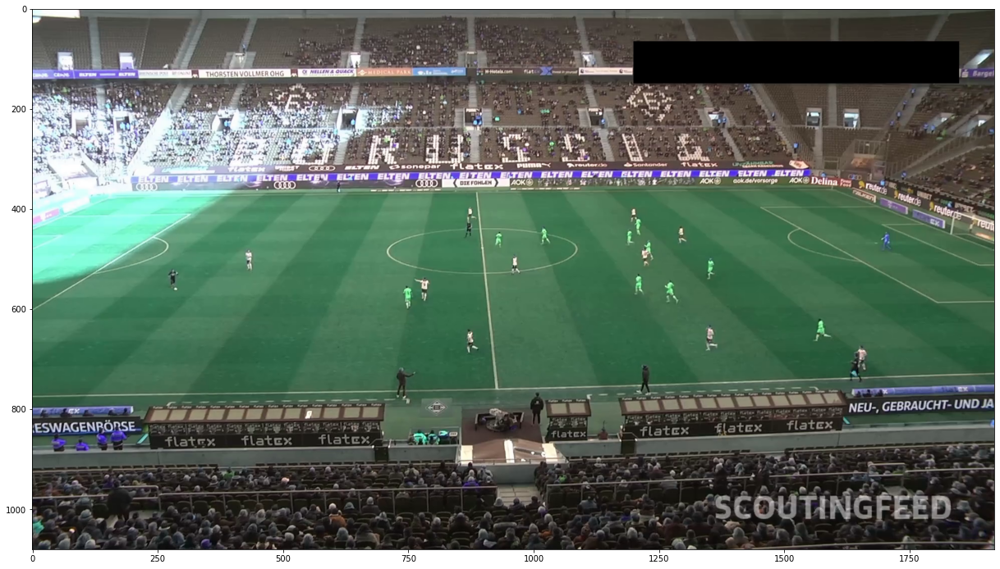

In [3]:
#OpenCV reads images as BGR format(BLUE GREEN RED)

#image.shape[0] = height and image.shape[1] = width
plt.figure(figsize=(image.shape[0]//50, image.shape[1]//50))
plt.imshow(image)

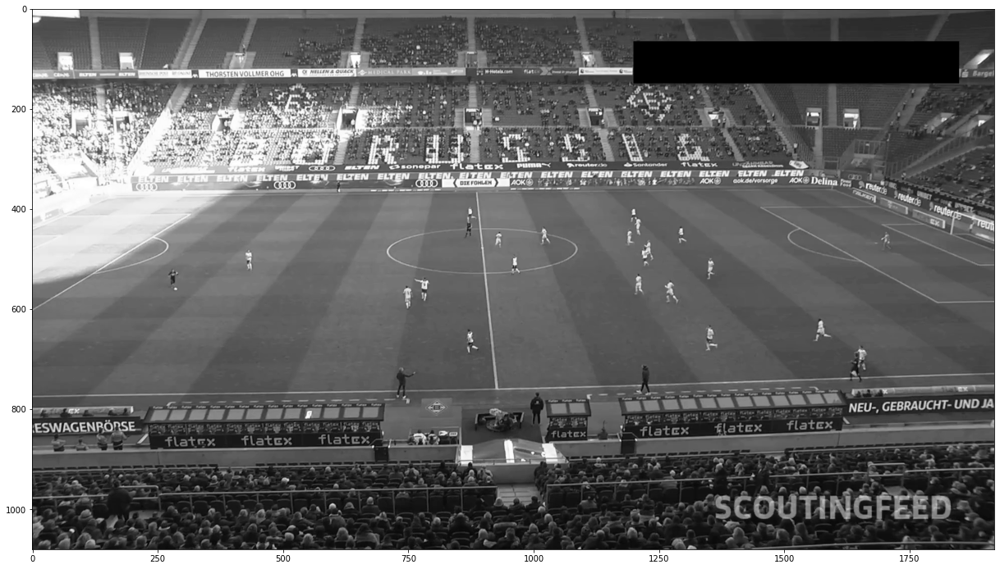

In [4]:
#BGR to #GreyScale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(gray.shape[0]//50, gray.shape[1]//50))
plt.imshow(gray, cmap='gray', vmin=0, vmax=255)

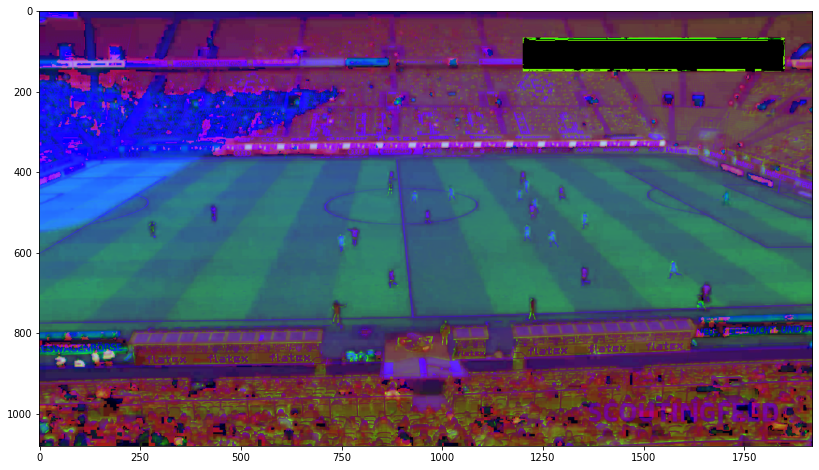

In [5]:
#BGR to #HSV 
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

plt.figure(figsize=(16,8))
plt.imshow(hsv)

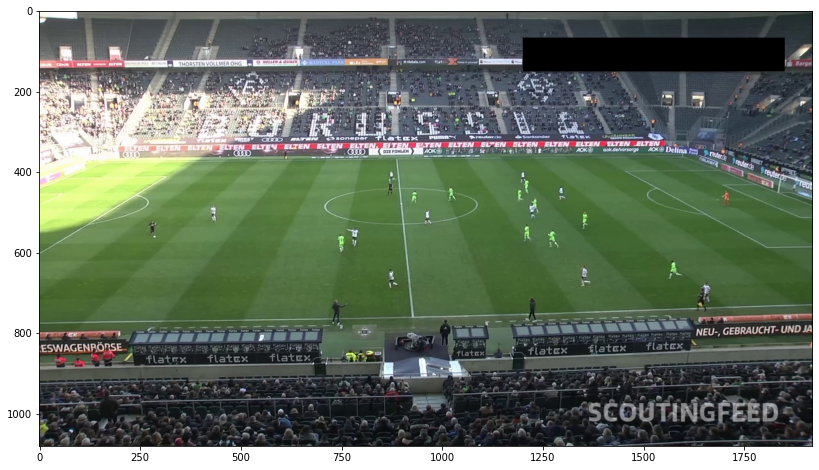

In [6]:
#BGR to RGB

image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(16, 8))
plt.imshow(image)

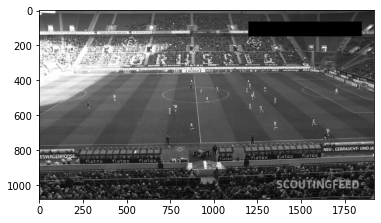

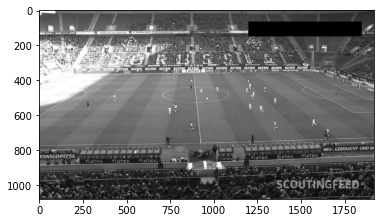

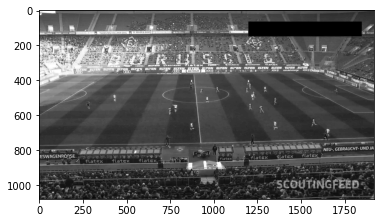

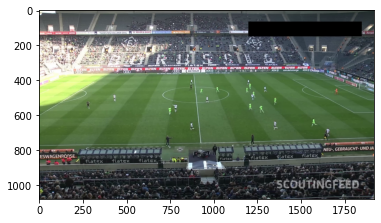

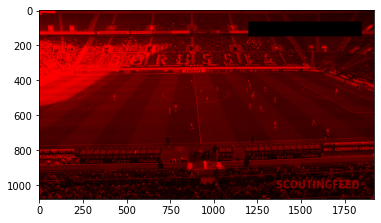

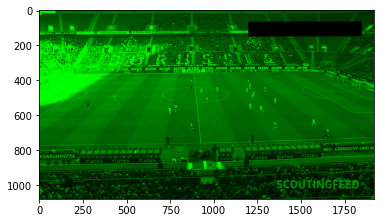

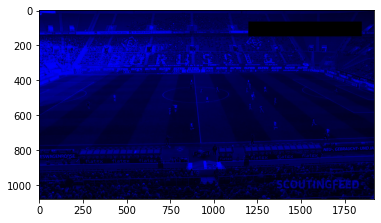

In [7]:
#Splitting into r,g,b channels

r,g,b = cv2.split(image)

plt.imshow(r,cmap='gray')
plt.show()
plt.imshow(g,cmap='gray')
plt.show()
plt.imshow(b,cmap='gray')
plt.show()

rgb_merged = cv2.merge([r,g,b])
plt.imshow(rgb_merged,cmap='gray')
plt.show()

blank = np.zeros(image.shape[:2],dtype="uint8")
rb = cv2.merge([r,blank,blank])
plt.imshow(rb)
plt.show()
gb = cv2.merge([blank,g,blank])
plt.imshow(gb)
plt.show()
bb = cv2.merge([blank,blank,b])
plt.imshow(bb)
plt.show()

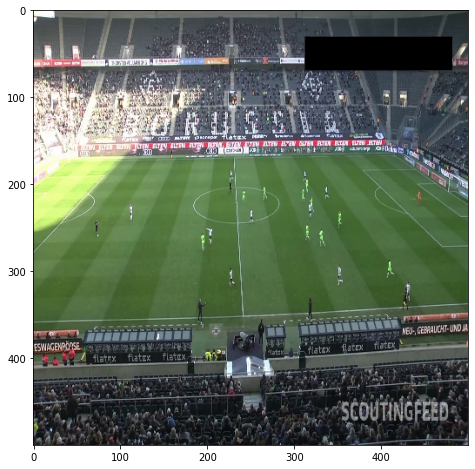

In [8]:
resized = cv2.resize(image,(500,500),interpolation=cv2.INTER_CUBIC)

plt.figure(figsize=(16, 8))
plt.imshow(resized)

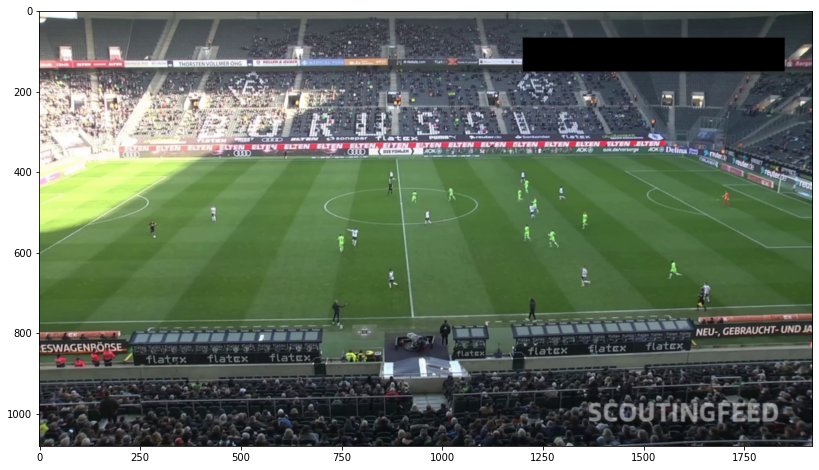

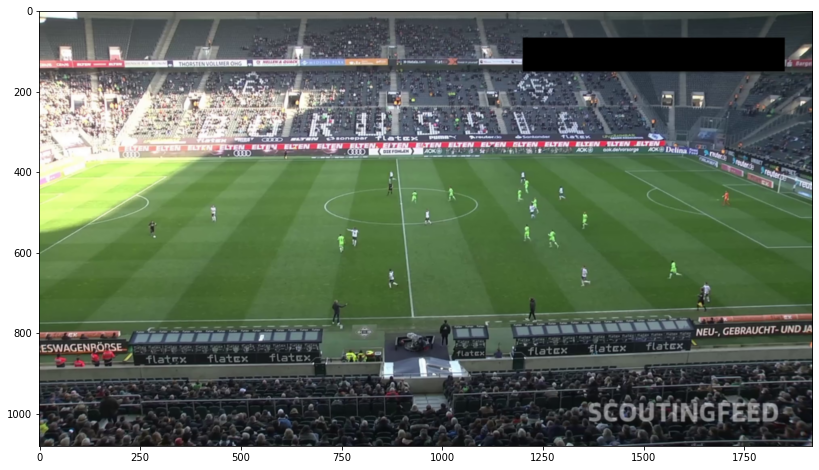

In [9]:
#Bluring 

s_blur = cv2.blur(image,(3,3))
plt.figure(figsize=(16, 8))
plt.imshow(s_blur)

blur = cv2.GaussianBlur(image,(3,3),cv2.BORDER_DEFAULT)
plt.figure(figsize=(16, 8))
plt.imshow(blur)

#### Edge Detection

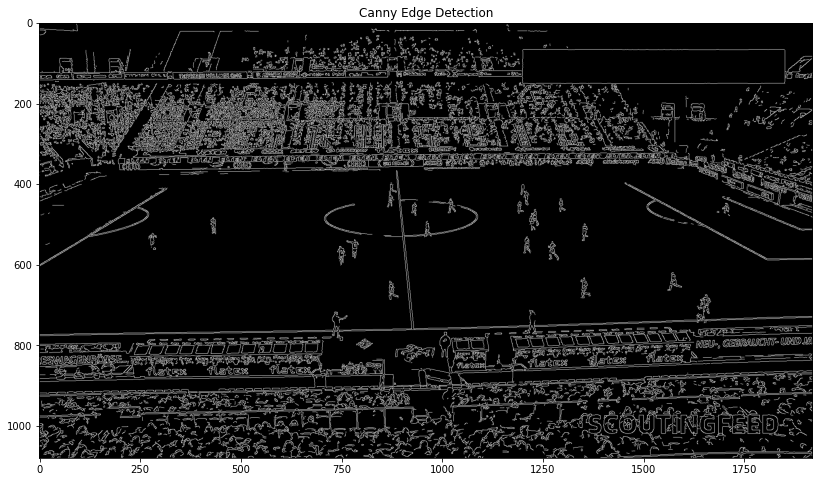

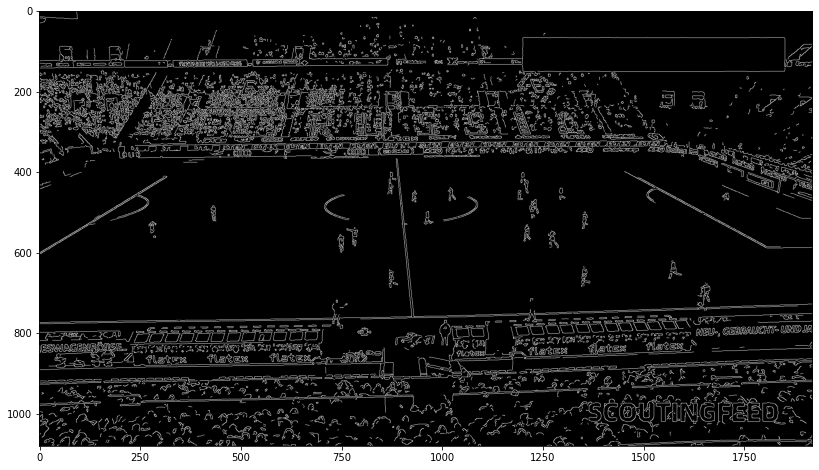

In [10]:
#Canny edge detector for finding edge cascades of the image
canny = cv2.Canny(image,125,175)
plt.figure(figsize=(16, 8))
plt.title("Canny Edge Detection")
plt.imshow(canny,cmap='gray')
plt.show()


#edge cascades after blurring
blurcanny = cv2.Canny(blur,125,175)
plt.figure(figsize=(16, 8))
plt.imshow(blurcanny,cmap='gray')

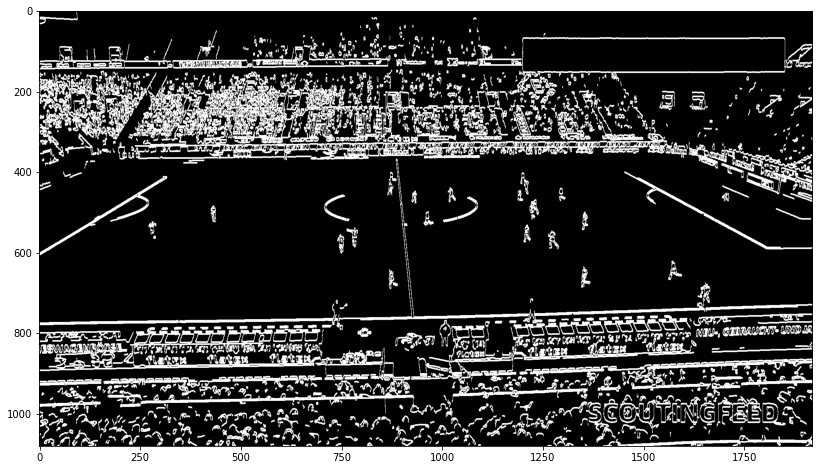

In [11]:
#dilated edges

dilated = cv2.dilate(blurcanny,(7,7),iterations=3)

plt.figure(figsize=(16, 8))
plt.imshow(dilated,cmap='gray')

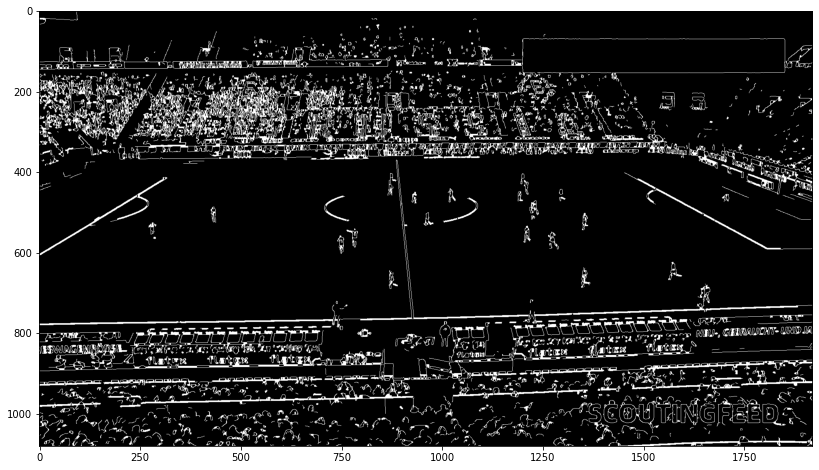

In [12]:
eroded = cv2.erode(dilated,(7,7),iterations=3)
plt.figure(figsize=(16, 8))
plt.imshow(eroded,cmap='gray')

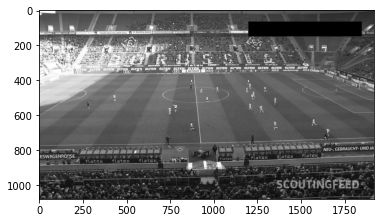

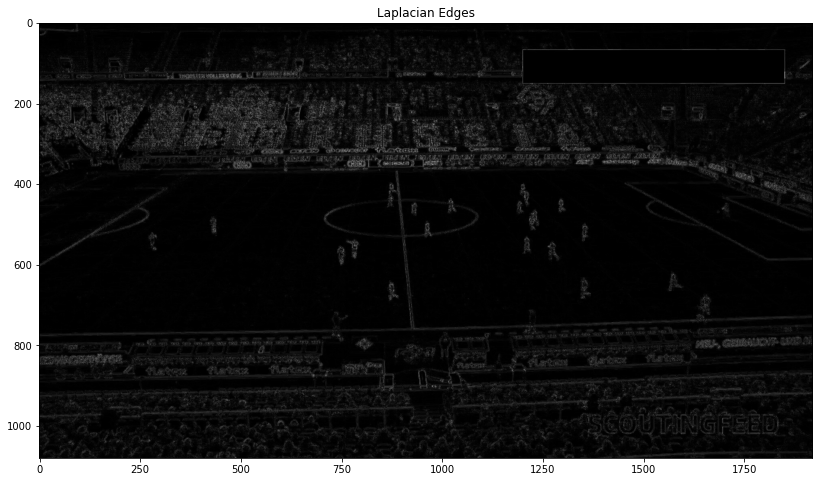

In [13]:
gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
plt.imshow(gray,cmap='gray')
plt.show() 

laplacian = cv2.Laplacian(gray,cv2.CV_64F)
lap = np.uint8(np.absolute(laplacian))
plt.figure(figsize=(16,8))
plt.title("Laplacian Edges")
plt.imshow(lap,cmap='gray')
plt.show()

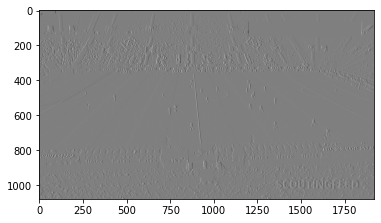

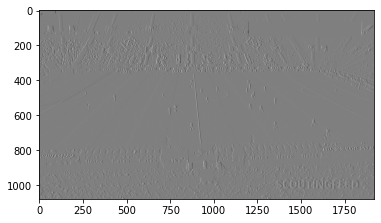

/opt/conda/lib/python3.7/site-packages/matplotlib/image.py:479: RuntimeWarning: invalid value encountered in subtract
  A_scaled -= a_min


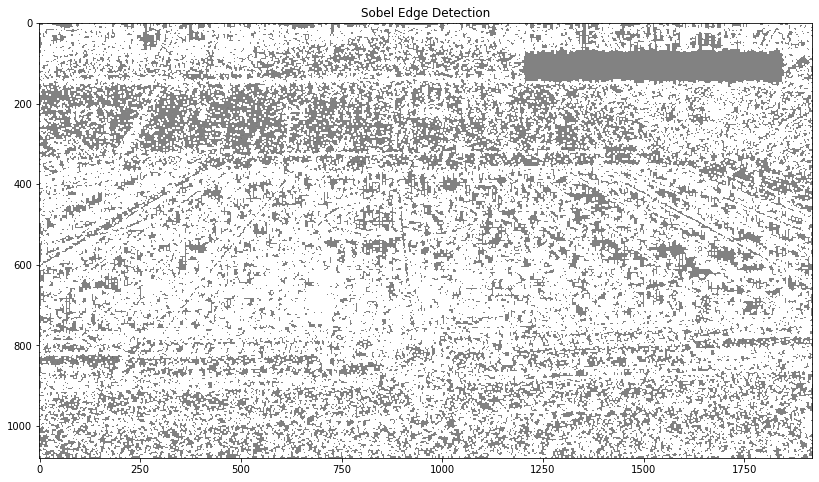

In [14]:
sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0)
sobely = cv2.Sobel(gray,cv2.CV_64F,0,1)

combined_sobel = cv2.bitwise_or(sobelx,sobely)

plt.imshow(sobelx,cmap='gray')
plt.show()
plt.imshow(sobelx,cmap='gray')
plt.show()
plt.figure(figsize=(16,8))
plt.title("Sobel Edge Detection")
plt.imshow(combined_sobel,cmap='gray')
plt.show()

In [15]:
#Contour

#FindContours function only supports a grayscale image format
contours, hierarchies = cv2.findContours(canny,cv2.RETR_LIST,cv2.CHAIN_APPROX_NONE)

print(len(contours))

7499


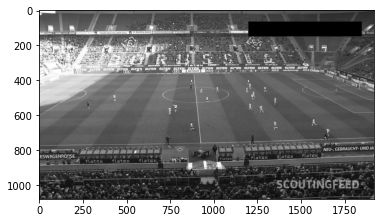

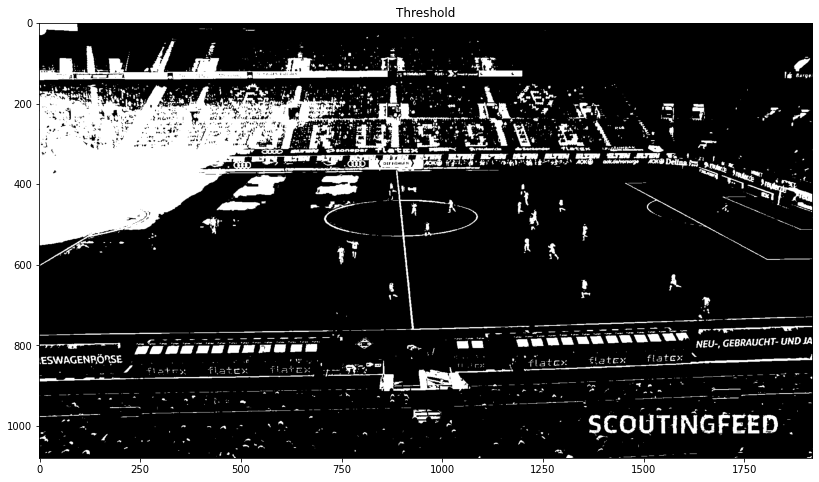

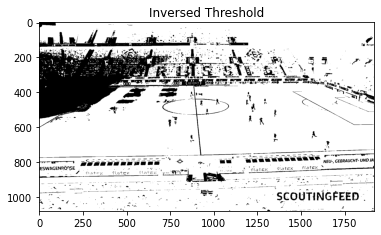

  3277 contour(s) found


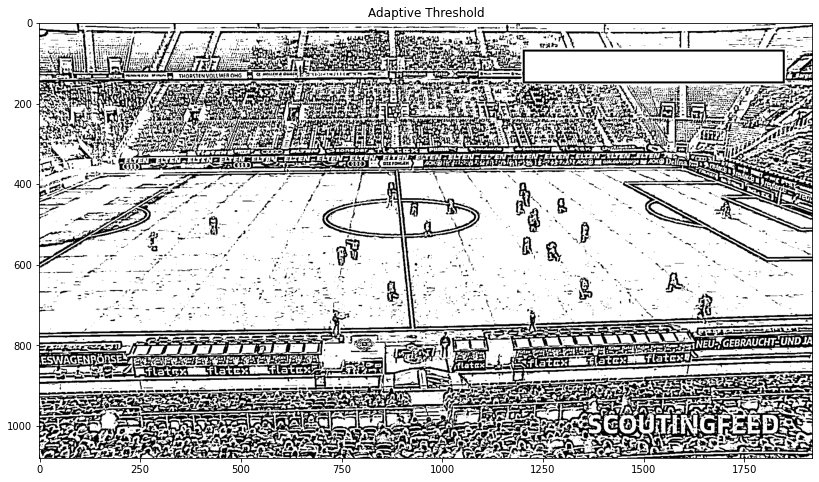

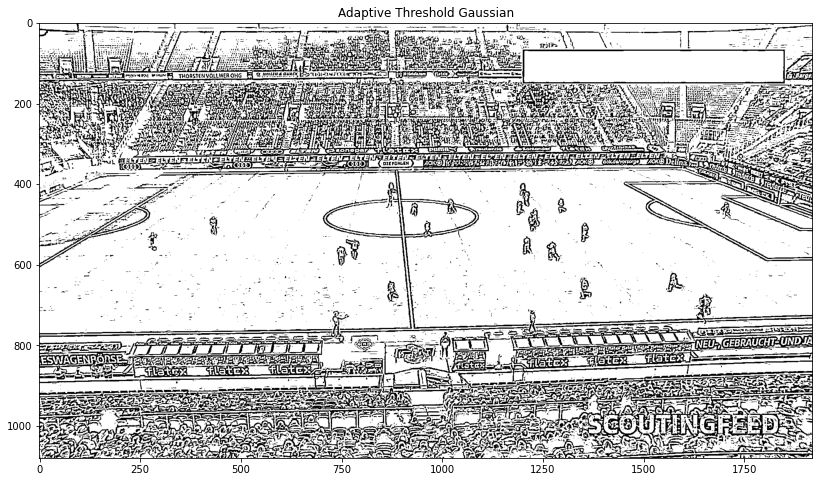

In [16]:
#Thresholding an image - Binarizing an image

gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
plt.imshow(gray,cmap='gray')
plt.show() 

#if pixel value greater than 125 set it to 255 else set it to 0
ret, thresh = cv2.threshold(gray,125,255,cv2.THRESH_BINARY) 
contours_t, hierarchies_t = cv2.findContours(thresh,cv2.RETR_LIST,cv2.CHAIN_APPROX_NONE)
plt.figure(figsize=(16,8))
plt.title("Threshold")
plt.imshow(thresh,cmap='gray')
plt.show() 

threshold_inv, thresh_inverse = cv2.threshold(gray,125,255,cv2.THRESH_BINARY_INV) 
plt.title("Inversed Threshold")
plt.imshow(thresh_inverse,cmap='gray')
plt.show() 

print(f' \033[1m {len(contours_t)} contour(s) found')


#kernal size of 11x11 is slide over to compute mean of pixels and finds the oprtimal threshold value for that specific part                                                                                                                
adaptive_threshold = cv2.adaptiveThreshold(
    gray,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,11,3 
    )
plt.figure(figsize=(16,8))
plt.title('Adaptive Threshold')
plt.imshow(adaptive_threshold,cmap='gray')
plt.show()

adaptive_threshold_gaussian = cv2.adaptiveThreshold(
    gray,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,11,3 
    )
plt.figure(figsize=(16,8))
plt.title('Adaptive Threshold Gaussian')
plt.imshow(adaptive_threshold_gaussian,cmap='gray')
plt.show()

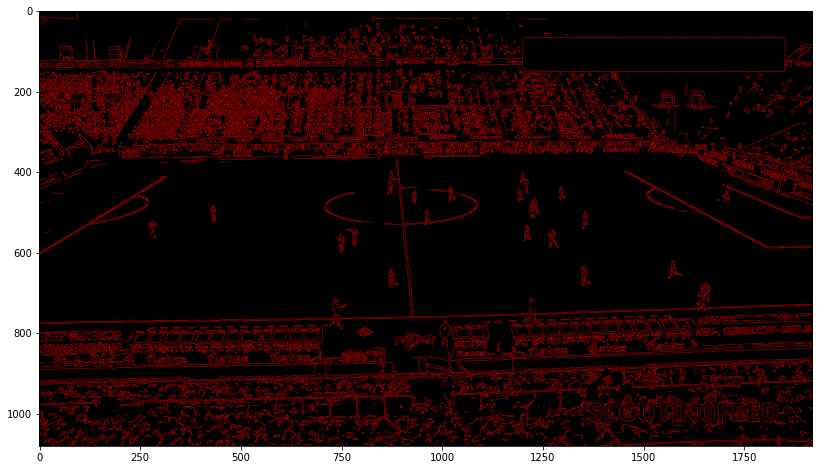

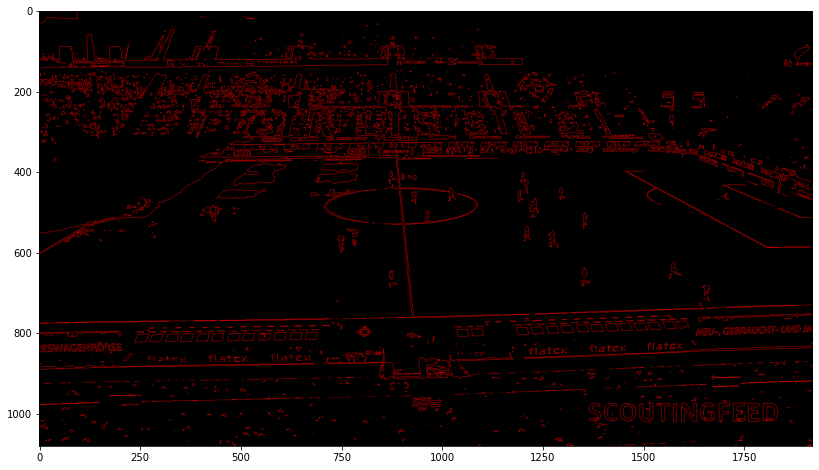

In [17]:
blank = np.zeros(image.shape,dtype='uint8')

cv2.drawContours(blank,contours,-1,(255,0,0),1)

plt.figure(figsize=(16, 8))
plt.imshow(blank,cmap='gray')
plt.show()


blank_t = np.zeros(image.shape,dtype='uint8')
cv2.drawContours(blank_t,contours_t,-1,(255,0,0),1)
plt.figure(figsize=(16, 8))
plt.imshow(blank_t,cmap='gray')

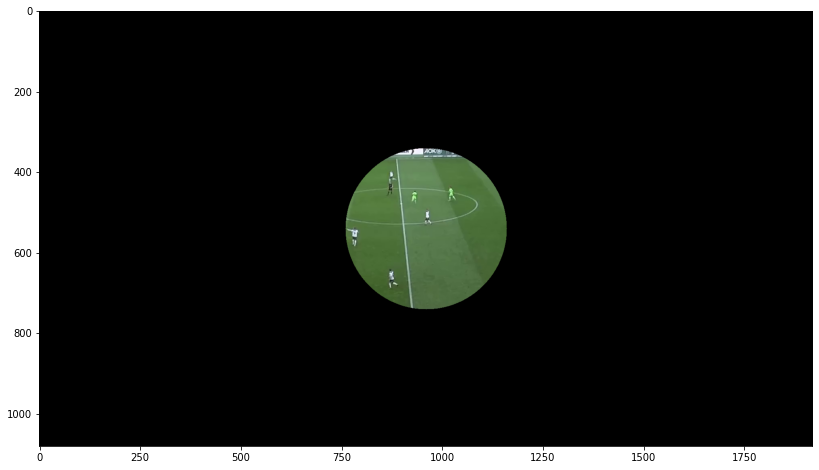

In [18]:
blank = np.zeros(image.shape[:2],dtype="uint8")
mask = cv2.circle(blank,(image.shape[1]//2,image.shape[0]//2),200,255,-1)

masked = cv2.bitwise_and(image,image,mask=mask)

plt.figure(figsize=(16, 8))
plt.imshow(masked,cmap='gray')

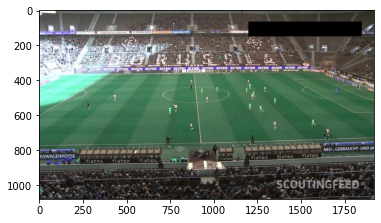

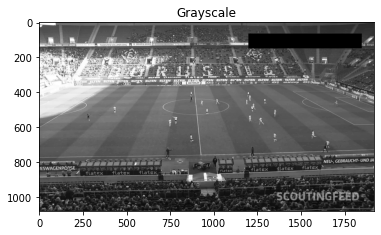

<Figure size 432x288 with 0 Axes>

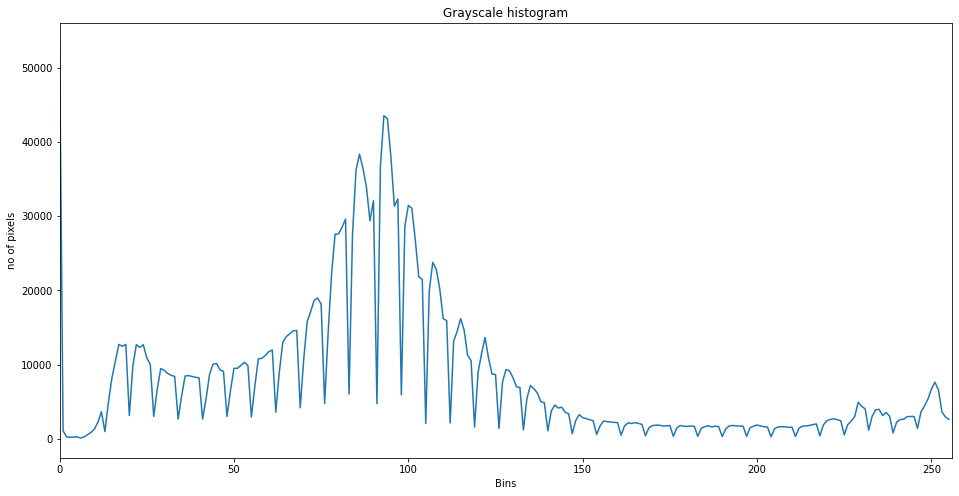

<Figure size 432x288 with 0 Axes>

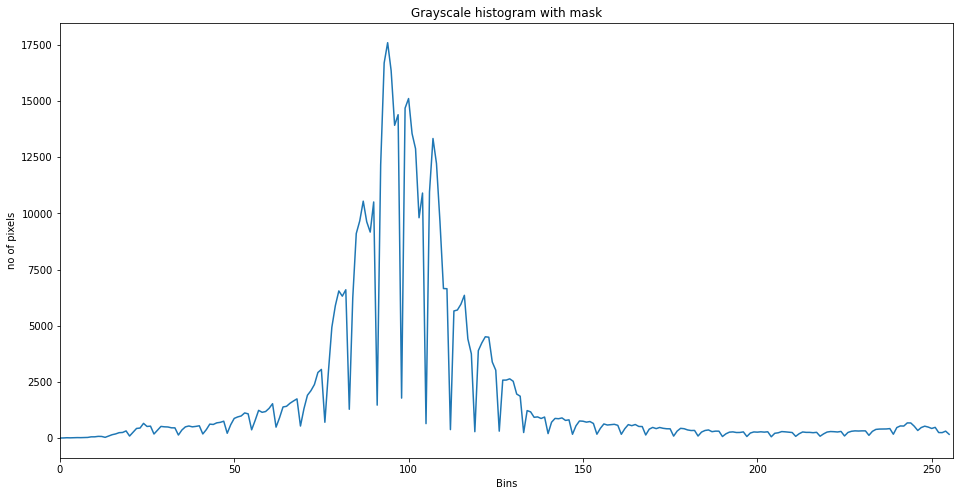

<Figure size 432x288 with 0 Axes>

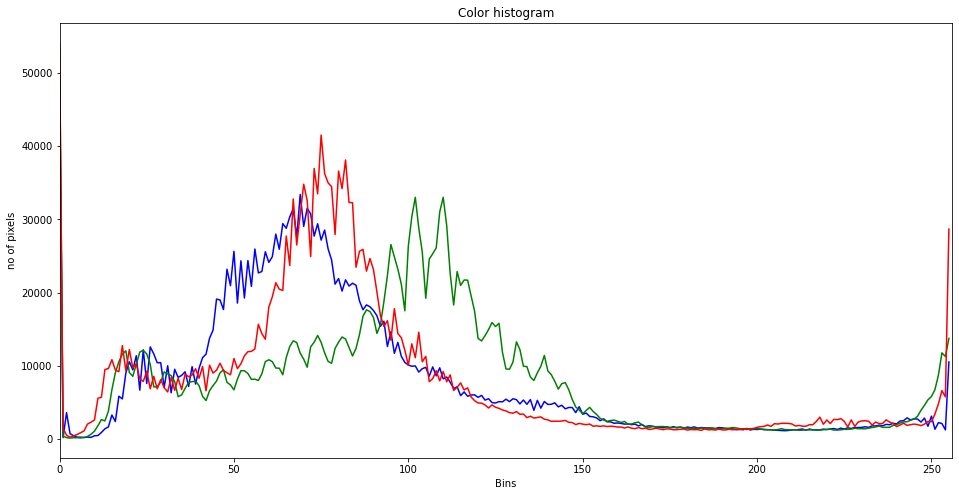

<Figure size 432x288 with 0 Axes>

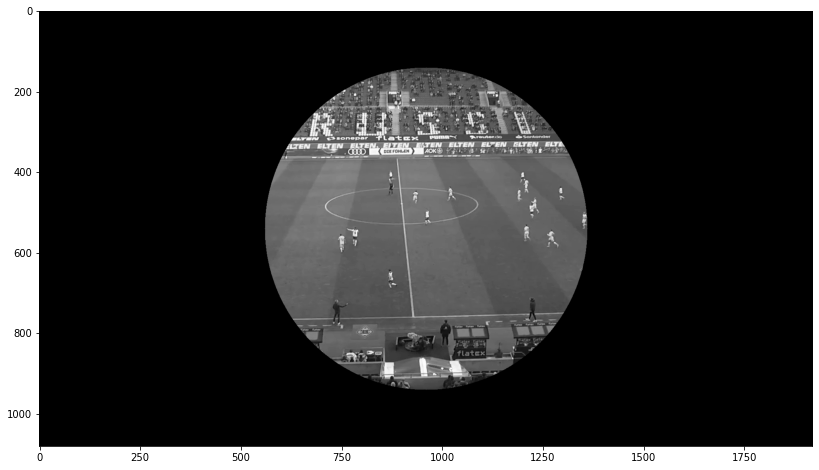

<Figure size 432x288 with 0 Axes>

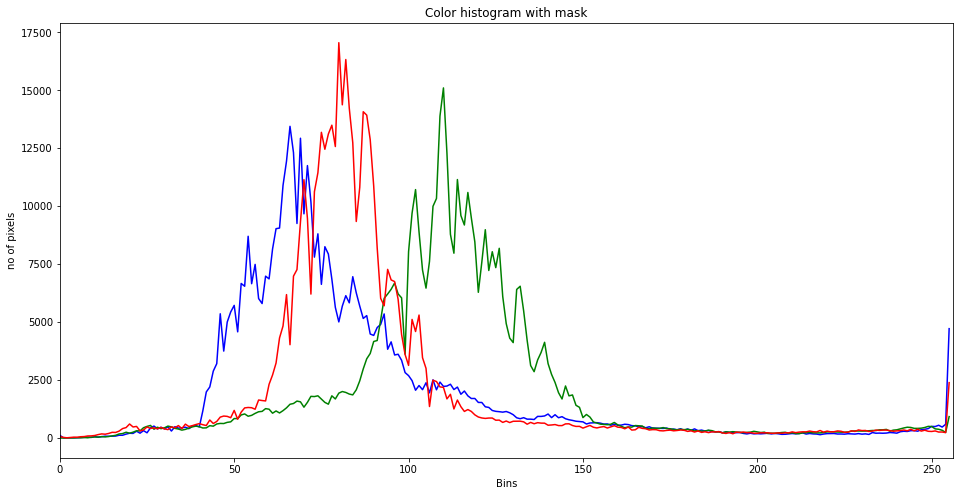

In [19]:
#histograms

success, img = vidcap.read()
plt.imshow(img)
plt.show()
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.title("Grayscale")
plt.imshow(gray, cmap='gray', vmin=0, vmax=255)


gray_hist = cv2.calcHist([gray],[0],None,[256],[0,256])

plt.figure()
plt.figure(figsize=(16, 8))
plt.title('Grayscale histogram')
plt.xlabel("Bins")
plt.ylabel('no of pixels')
plt.plot(gray_hist)
plt.xlim([0,256])
plt.show()

blank = np.zeros(img.shape[:2],dtype='uint8')
circle = cv2.circle(blank,(img.shape[1]//2,img.shape[0]//2),400,255,-1)
mask = cv2.bitwise_and(gray,gray,mask=circle)


gray_mask_hist = cv2.calcHist([gray],[0],mask,[256],[0,256])

plt.figure()
plt.figure(figsize=(16, 8))
plt.title('Grayscale histogram with mask')
plt.xlabel("Bins")
plt.ylabel('no of pixels')
plt.plot(gray_mask_hist)
plt.xlim([0,256])
plt.show()

plt.figure()
plt.figure(figsize=(16, 8))
plt.title('Color histogram')
plt.xlabel("Bins")
plt.ylabel('no of pixels')
colors = ('b','g','r')
for i,col in enumerate(colors):
    hist_color = cv2.calcHist([img],[i],None,[256],[0,256])
#     plt.figure()
#     plt.title('%s Color histogram' %(col))
#     plt.xlabel("Bins")
#     plt.ylabel('no of pixels')
    plt.plot(hist_color,color=col)
    plt.xlim([0,256])    
plt.show()

plt.figure()
plt.figure(figsize=(16, 8))
plt.imshow(mask,cmap='gray')
plt.show()

plt.figure()
plt.figure(figsize=(16, 8))
plt.title('Color histogram with mask')
plt.xlabel("Bins")
plt.ylabel('no of pixels')
colors = ('b','g','r')
for i,col in enumerate(colors):
    hist_color = cv2.calcHist([img],[i],mask,[256],[0,256])    
    plt.plot(hist_color,color=col)
    plt.xlim([0,256])    
plt.show()

In [20]:
##### vidcap = cv2.VideoCapture(path)

fps = vidcap.get(cv2.CAP_PROP_FPS)
print(f"fps: {fps}")
frame_count = vidcap.get(cv2.CAP_PROP_FRAME_COUNT)
print(f"frame_count: {frame_count}")

count = 0
success, image = vidcap.read()
while success:
    count += 1
    success, image = vidcap.read()

print(f"{count} frames.")

fps: 25.0
frame_count: 750.0
748 frames.


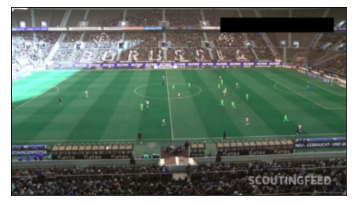

In [21]:
capture = cv2.VideoCapture(path)
isTrue,frame = capture.read()

if isTrue:
#     cv2.imshow('video frames',frame)        
    plt.imshow(frame, cmap = 'gray', interpolation = 'bicubic')
    plt.xticks([]), plt.yticks([])  # to hide tick values on X and Y axis
    plt.show()

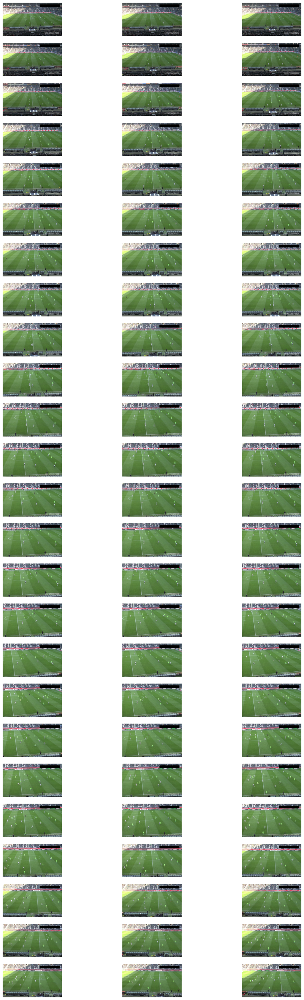

In [22]:
plt.figure(figsize=(16, 48))

vidcap = cv2.VideoCapture(path)
np_video = []

success, image = vidcap.read()
count = 0
step = 10
while success:
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    np_video.append(image)
    if not count % step:                
        plt.subplot(25,3,count // step + 1)
        plt.imshow(image)
        plt.axis("off")
    success, image = vidcap.read()
    
    count += 1

#### Rescaling

In [23]:
def rescaleFrame(frame, scale=0.75):
    width = int(frame.shape[1]*scale)
    height = int(frame.shape[0]*scale)
    dimensions = (width, height)

    return cv2.resize(frame, dimensions, interpolation=cv2.INTER_AREA)

In [24]:
vidcap = cv2.VideoCapture(path)
success, image = vidcap.read()
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

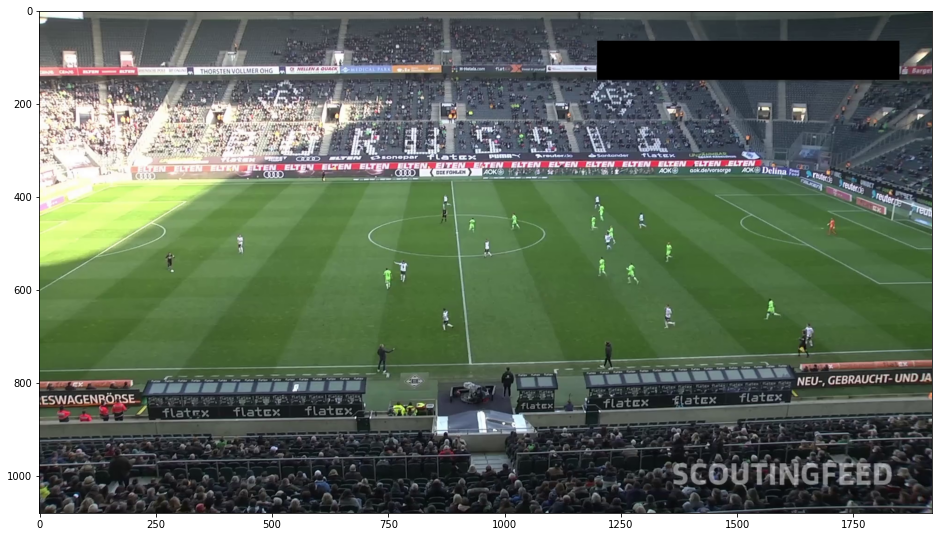

In [25]:
plt.figure(figsize=(16, 48))
plt.imshow(image)

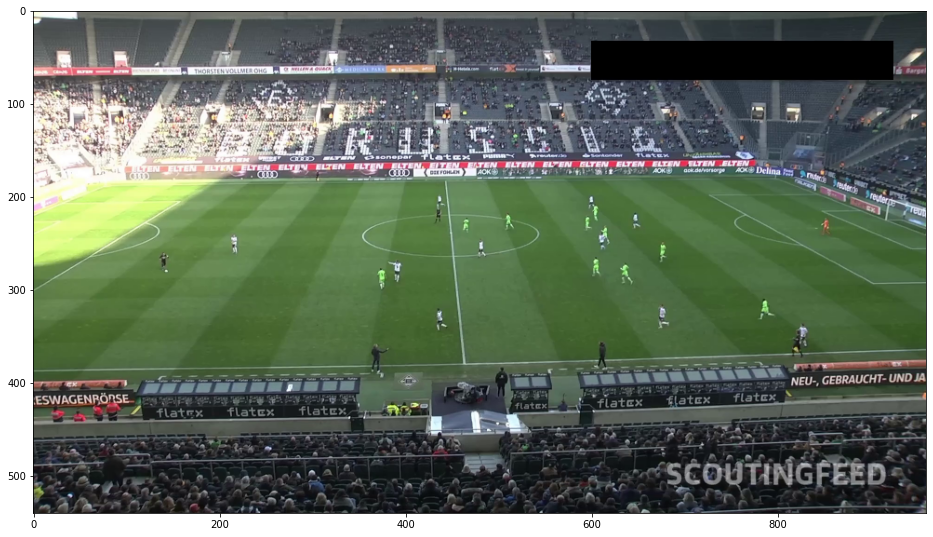

In [26]:
rsc = rescaleFrame(image,0.5)

plt.figure(figsize=(16, 48))
plt.imshow(rsc)

image


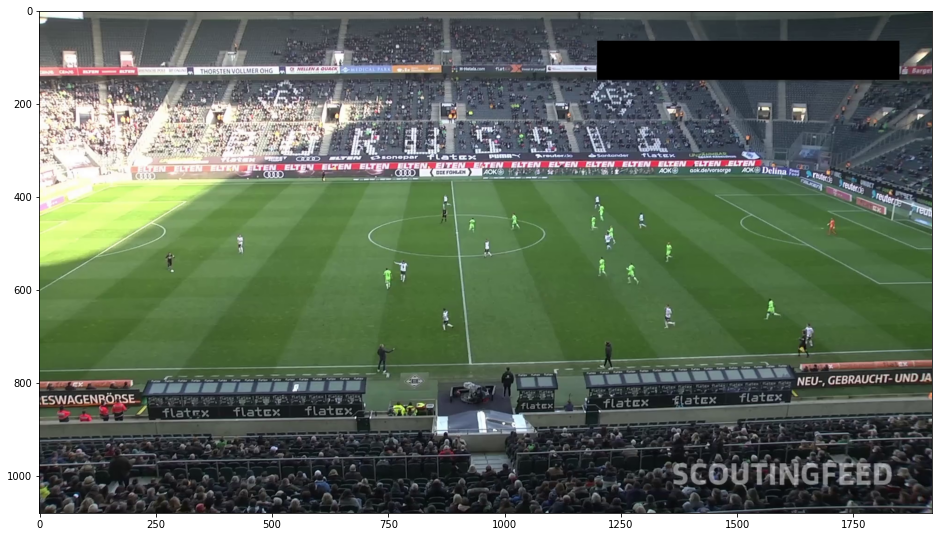

resised


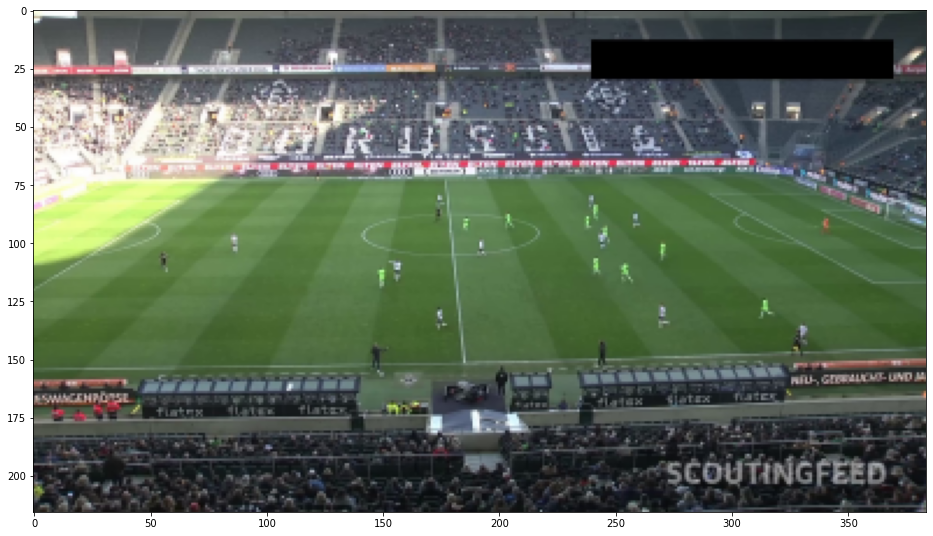

In [27]:
plt.figure(figsize=(16, 48))

vidcap = cv2.VideoCapture(path)

success, image = vidcap.read()
 
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
resised_image = rescaleFrame(image,0.2)
print("image")        
plt.imshow(image)        
plt.show()# this will load image to console before executing next line of code                          
plt.figure(figsize=(16, 48))                           
print("resised")
plt.imshow(resised_image)        
plt.show()

In [28]:
pip list | grep opencv

opencv-contrib-python                 4.5.4.60
opencv-python                         4.5.4.60
opencv-python-headless                4.5.4.60
Note: you may need to restart the kernel to use updated packages.


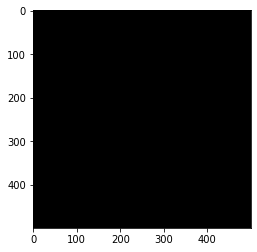

In [29]:
blank = np.zeros((500,500,3),dtype='uint8')
plt.imshow(blank)

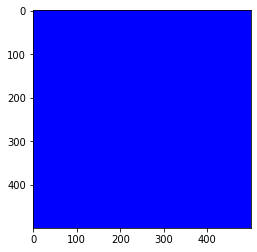

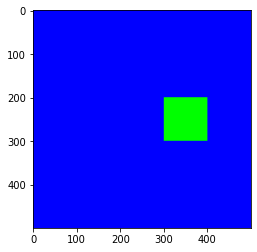

In [30]:
blank[:] = 0,0,255
plt.imshow(blank)
plt.show()

blank[200:300,300:400] = 0,255,0
plt.imshow(blank)

##### Drawing a Rectangle, Cicle and Line

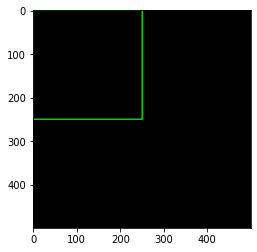

In [31]:
#Rectangle

blank = np.zeros((500,500,3),dtype='uint8')
cv2.rectangle(blank,(0,0),(250,250),(0,255,0),thickness=2)
plt.imshow(blank)

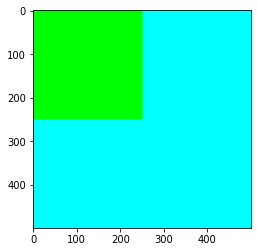

In [32]:
blank = np.zeros((500,500,3),dtype='uint8')
blank[:] = 0,255,255
cv2.rectangle(blank,(0,0),(blank.shape[0]//2,blank.shape[1]//2),(0,255,0),thickness=-1)
plt.imshow(blank)

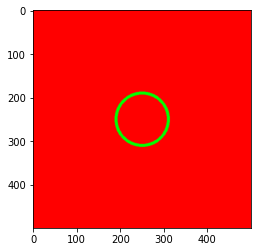

In [33]:
#Circle

blank = np.zeros((500,500,3),dtype='uint8')
blank[:] = 255,0,0

cv2.circle(blank,(blank.shape[0]//2,blank.shape[1]//2),60,(0,255,0),thickness=5)
plt.imshow(blank)

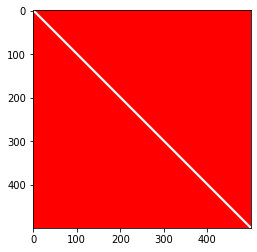

In [34]:
img = np.zeros((500,500,3),dtype='uint8')
img[:] = 255,0,0

cv2.line(img,(0,0),(img.shape[0],img.shape[1]),(255,255,255),thickness=4)
plt.imshow(img)

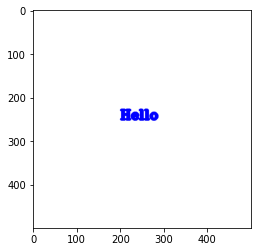

In [35]:
img = np.zeros((500,500,3),dtype='uint8')
img[:] = 255,255,255

cv2.putText(img, "Hello", (200,250), cv2.FONT_HERSHEY_TRIPLEX, 1, (0,0,255), thickness=5)
plt.imshow(img)